# Documentation Summary & Highlights
 

This is the 2006 edition of the U. S. Census Bureau’s Government Finance and Employment
Classification Manual. It contains the statistical classification categories and definitions that are
applicable to the Census Bureau’s statistical programs covering government finances and public
employment. These include the census of governments, as well as other annual and quarterly surveys of
government finance and employment. These statistical programs are conducted by the Census Bureau’s
Governments Division.


Individual governments are the basic reporting units for Census Bureau statistics on government finance
and employment. The government entity includes the parent government and all agencies, institutions,
and authorities connected to it. To identify the latter, the Census Bureau uses an established set of criteria
to determine which of the government organizations with governmental or quasi-governmental character
should be included in the government sector. For statistical surveys, the central or primary government is
often referred to as the parent government. The associated agencies, institutions, and authorities are
generally referred to as dependent agencies of the parent government.

## Critical Features

Total_Revenue

Property_Tax

Tot_Sales___Gr_Rec_Tax

Public_Utility_Tax

Total_License_Taxes

Total_Income_Taxes

Total_Fed_IG_Revenue

Total_State_IG_Revenue

Tot_Local_IG_Rev

---------------------------------------------------------------------------
Year4

ID

State_Code

Type_Code

County

Name

Population

# Revenue & Expenditure of Municipal Government King County

# Importing Libraries

In [10]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 500)   # Display up to 135 columns of a dataframe
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['font.size'] = 24
from IPython.core.pylabtools import figsize
import seaborn as sns
sns.set(font_scale = 2)
from sklearn.model_selection import train_test_split

import time
np.random.seed(42) # To make notebooks output identical at every run

import warnings # this module inores any warning output
warnings.filterwarnings('ignore')

In [105]:
#!pip install cufflinks plotly

In [16]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot
# Using cufflinks in offline mode
import cufflinks
cufflinks.go_offline()
# Set the global theme for cufflinks
cufflinks.set_config_file(world_readable=True, theme='pearl', offline=True)


# Loading Data

## Municipal Government Data  

In [11]:
import os  # operating system dependent functionality
os.chdir('/Users/tosinbosede/Downloads/MunicipalData') # Set the working directory
Municipal_Data = 'MunicipalData.csv' # assign variable Data to the data file name
Municipal_df = pd.read_csv(Municipal_Data)

Municipal_df.head()

,SurveyYr,Year4,YearofData,ID,IDChanged,State_Code,Type_Code,County,Name,FIPS_Code_State,FIPS_County,FIPS_Place,FYEndDate,YearPop,SchLevCode,Population,FunctionCode,Enrollment,Total_Revenue,Total_Rev_Own_Sources,General_Revenue,Gen_Rev_Own_Sources,Total_Taxes,Property_Tax,Tot_Sales___Gr_Rec_Tax,Total_Gen_Sales_Tax,Total_Select_Sales_Tax,Alcoholic_Beverage_Tax,Amusement_Tax,Insurance_Premium_Tax,Motor_Fuels_Tax,Pari_mutuels_Tax,Public_Utility_Tax,Tobacco_Tax,Other_Select_Sales_Tax,Total_License_Taxes,Alcoholic_Beverage_Lic,Amusement_License,Corporation_License,Hunting___Fishing_License,Motor_Vehicle_License,Motor_Veh_Oper_License,Motor_Vehicle_License_Total,Public_Utility_License,Occup_and_Bus_Lic_NEC,Other_License_Taxes,Total_Income_Taxes,Individual_Income_Tax,Corp_Net_Income_Tax,Death_and_Gift_Tax,Docum_and_Stock_Tr_Tax,Severance_Tax,Taxes_NEC,Total_IG_Revenue,Total_Fed_IG_Revenue,Fed_IGR_Air_Transport,Fed_IGR_Education,Fed_IGR_Emp_Sec_Adm,Fed_IGR_Gen_Rev_Shar,Fed_IGR_Gen_Support,Fed_IGR_Health___Hos,Fed_IGR_Highways,Fed_IGR_Transit_Sub,Fed_IGR_Hous_Com_Dev,Fed_IGR_Natural_Res,Fed_IGR_Public_Welf,Fed_IGR_Sewerage,Fed_IGR_Other,Total_State_IG_Revenue,State_IGR_Education,State_IGR_Tax_Relief,State_IGR_Oth_Gen_Sup,State_IGR_Gen_Sup,State_IGR_Health___Hos,State_IGR_Highways,State_IGR_Transit_Sub,State_IGR_Hous_Com_Dev,State_IGR_Public_Welf,State_IGR_Sewerage,State_IGR_Other,Tot_Local_IG_Rev,Local_IGR_InterSchool_Aid,Local_IGR_Other_Education,Local_IGR_Oth_Gen_Sup,Local_IGR_Health___Hos,Local_IGR_Highways,Local_IGR_Transit_Sub,Local_IGR_Hous_Com_Dev,Local_IGR_Public_Welf,Local_IGR_Sewerage,Local_IGR_Other,Tot_Chgs_and_Misc_Rev,Total_General_Charges,Chg_Air_Transportation,Chg_Misc_Com_Activ,Chg_Total_Education,Chg_Total_Elem_Education,Chg_Elem_Ed_Sch_Lunch,Chg_Elem_Ed_Tuition,Chg_Elem_Ed_NEC,Chg_Total_High_Ed,Chg_Hospitals,Chg_Highways,Chg_Regular_Highways,Chg_Toll_Highways,Chg_Housing___Comm_Dev,Chg_Total_Nat_Res,Chg_Parking,Chg_Parks___Recreation,Chg_Sewerage,Chg_Solid_Waste_Mgmt,Chg_Water_Transport,Chg_All_Other_NEC,Misc_General_Revenue,Special_Assessments,Prop_Sale_Total,Prop_Sale_Hous_Com_Dev,Prop_Sale_Other,Interest_Revenue,Fines_and_Forfeits,Rents_and_Royalties,Net_Lottery_Revenue,Misc_General_Rev_NEC,Liquor_Stores_Revenue,Total_Utility_Revenue,Water_Utility_Revenue,Electric_Utility_Rev,Gas_Utility_Rev,Transit_Utility_Rev,Total_Insur_Trust_Rev,Total_Insur_Trust_Ctrb,Tot_Ins_Trust_Inv_Rev,Total_Emp_Ret_Rev,Emp_Ret_Total_Ctrib,Emp_Ret_Loc_Emp_Ctrib,Emp_Ret_Loc_To_Loc_Sys,Emp_Ret_From_Other_Gov,Emp_Ret_Sta_To_Sta_Ctr,Emp_Ret_Int_Rev,Emp_Ret_Other_Earnings,Total_Unemp_Rev,Unemp_Payroll_Tax,Unemp_Int_Revenue,Unemp_Federal_Advances,Total_Expenditure,Total_IG_Expenditure,Direct_Expenditure,Total_Current_Expend,Total_Current_Oper,Total_Capital_Outlays,Total_Construction,Total_Other_Capital_Outlays,Tot_Assist___Subsidies,Total_Interest_on_Debt,Total_Insur_Trust_Ben,Total_Salaries___Wages,General_Expenditure,IG_Exp_To_State_Govt,IG_Exp_To_Local_Govts,IG_Exp_To_Federal_Govt,Direct_General_Expend,General_Current_Expend,General_Current_Oper,General_Capital_Outlay,General_Construction,General_Capital_Outlay_Other,General_Assist___Sub,General_Debt_Interest,Air_Trans_Total_Expend,Air_Trans_Direct_Expend,Air_Trans_Cap_Outlay,Air_Trans_Current_Exp,Air_Trans_Construction,Air_Trans_IG_To_State,Air_Trans_IG_Local_Govts,Misc_Com_Activ_Tot_Exp,Misc_Com_Activ_Cap_Out,Misc_Com_Activ_Current_Exp,Misc_Com_Activ_Constr,Correct_Total_Exp,Correct_Direct_Exp,Correct_Cap_Outlay,Correct_Current_Exp,Correct_Construct,Correct_IG_To_St,Correct_IG_Loc_Govts,Total_Educ_Total_Exp,Total_Educ_Direct_Exp,Total_Educ_Assist___Sub,Total_Educ_Cap_Outlay,Total_Educ_Current_Exp,Total_Educ_Construct,Elem_Educ_Total_Exp,Elem_Educ_Direct_Exp,Elem_Educ_Cap_Outlay,Elem_Educ_Current_Exp,Elem_Educ_Construction,Elem_Educ_IG_To_State,Elem_Educ_IG_Local_Govts,Elem_Educ_IG_Sch_to_Sch,Higher_Ed_Total_Exp,Higher_Ed_Direct_Exp,Higher_Ed_Cap_Outlay,Higher_Ed_Current_Exp,Higher_Ed_Constr

In [106]:
Municipal_df.tail(3)

,SurveyYr,Year4,YearofData,ID,IDChanged,State_Code,Type_Code,County,Name,FIPS_Code_State,FIPS_County,FIPS_Place,FYEndDate,YearPop,SchLevCode,Population,FunctionCode,Enrollment,Total_Revenue,Total_Rev_Own_Sources,General_Revenue,Gen_Rev_Own_Sources,Total_Taxes,Property_Tax,Tot_Sales___Gr_Rec_Tax,Total_Gen_Sales_Tax,Total_Select_Sales_Tax,Alcoholic_Beverage_Tax,Amusement_Tax,Insurance_Premium_Tax,Motor_Fuels_Tax,Pari_mutuels_Tax,Public_Utility_Tax,Tobacco_Tax,Other_Select_Sales_Tax,Total_License_Taxes,Alcoholic_Beverage_Lic,Amusement_License,Corporation_License,Hunting___Fishing_License,Motor_Vehicle_License,Motor_Veh_Oper_License,Motor_Vehicle_License_Total,Public_Utility_License,Occup_and_Bus_Lic_NEC,Other_License_Taxes,Total_Income_Taxes,Individual_Income_Tax,Corp_Net_Income_Tax,Death_and_Gift_Tax,Docum_and_Stock_Tr_Tax,Severance_Tax,Taxes_NEC,Total_IG_Revenue,Total_Fed_IG_Revenue,Fed_IGR_Air_Transport,Fed_IGR_Education,Fed_IGR_Emp_Sec_Adm,Fed_IGR_Gen_Rev_Shar,Fed_IGR_Gen_Support,Fed_IGR_Health___Hos,Fed_IGR_Highways,Fed_IGR_Transit_Sub,Fed_IGR_Hous_Com_Dev,Fed_IGR_Natural_Res,Fed_IGR_Public_Welf,Fed_IGR_Sewerage,Fed_IGR_Other,Total_State_IG_Revenue,State_IGR_Education,State_IGR_Tax_Relief,State_IGR_Oth_Gen_Sup,State_IGR_Gen_Sup,State_IGR_Health___Hos,State_IGR_Highways,State_IGR_Transit_Sub,State_IGR_Hous_Com_Dev,State_IGR_Public_Welf,State_IGR_Sewerage,State_IGR_Other,Tot_Local_IG_Rev,Local_IGR_InterSchool_Aid,Local_IGR_Other_Education,Local_IGR_Oth_Gen_Sup,Local_IGR_Health___Hos,Local_IGR_Highways,Local_IGR_Transit_Sub,Local_IGR_Hous_Com_Dev,Local_IGR_Public_Welf,Local_IGR_Sewerage,Local_IGR_Other,Tot_Chgs_and_Misc_Rev,Total_General_Charges,Chg_Air_Transportation,Chg_Misc_Com_Activ,Chg_Total_Education,Chg_Total_Elem_Education,Chg_Elem_Ed_Sch_Lunch,Chg_Elem_Ed_Tuition,Chg_Elem_Ed_NEC,Chg_Total_High_Ed,Chg_Hospitals,Chg_Highways,Chg_Regular_Highways,Chg_Toll_Highways,Chg_Housing___Comm_Dev,Chg_Total_Nat_Res,Chg_Parking,Chg_Parks___Recreation,Chg_Sewerage,Chg_Solid_Waste_Mgmt,Chg_Water_Transport,Chg_All_Other_NEC,Misc_General_Revenue,Special_Assessments,Prop_Sale_Total,Prop_Sale_Hous_Com_Dev,Prop_Sale_Other,Interest_Revenue,Fines_and_Forfeits,Rents_and_Royalties,Net_Lottery_Revenue,Misc_General_Rev_NEC,Liquor_Stores_Revenue,Total_Utility_Revenue,Water_Utility_Revenue,Electric_Utility_Rev,Gas_Utility_Rev,Transit_Utility_Rev,Total_Insur_Trust_Rev,Total_Insur_Trust_Ctrb,Tot_Ins_Trust_Inv_Rev,Total_Emp_Ret_Rev,Emp_Ret_Total_Ctrib,Emp_Ret_Loc_Emp_Ctrib,Emp_Ret_Loc_To_Loc_Sys,Emp_Ret_From_Other_Gov,Emp_Ret_Sta_To_Sta_Ctr,Emp_Ret_Int_Rev,Emp_Ret_Other_Earnings,Total_Unemp_Rev,Unemp_Payroll_Tax,Unemp_Int_Revenue,Unemp_Federal_Advances,Total_Expenditure,Total_IG_Expenditure,Direct_Expenditure,Total_Current_Expend,Total_Current_Oper,Total_Capital_Outlays,Total_Construction,Total_Other_Capital_Outlays,Tot_Assist___Subsidies,Total_Interest_on_Debt,Total_Insur_Trust_Ben,Total_Salaries___Wages,General_Expenditure,IG_Exp_To_State_Govt,IG_Exp_To_Local_Govts,IG_Exp_To_Federal_Govt,Direct_General_Expend,General_Current_Expend,General_Current_Oper,General_Capital_Outlay,General_Construction,General_Capital_Outlay_Other,General_Assist___Sub,General_Debt_Interest,Air_Trans_Total_Expend,Air_Trans_Direct_Expend,Air_Trans_Cap_Outlay,Air_Trans_Current_Exp,Air_Trans_Construction,Air_Trans_IG_To_State,Air_Trans_IG_Local_Govts,Misc_Com_Activ_Tot_Exp,Misc_Com_Activ_Cap_Out,Misc_Com_Activ_Current_Exp,Misc_Com_Activ_Constr,Correct_Total_Exp,Correct_Direct_Exp,Correct_Cap_Outlay,Correct_Current_Exp,Correct_Construct,Correct_IG_To_St,Correct_IG_Loc_Govts,Total_Educ_Total_Exp,Total_Educ_Direct_Exp,Total_Educ_Assist___Sub,Total_Educ_Cap_Outlay,Total_Educ_Current_Exp,Total_Educ_Construct,Elem_Educ_Total_Exp,Elem_Educ_Direct_Exp,Elem_Educ_Cap_Outlay,Elem_Educ_Current_Exp,Elem_Educ_Construction,Elem_Educ_IG_To_State,Elem_Educ_IG_Local_Govts,Elem_Educ_IG_Sch_to_Sch,Higher_Ed_Total_Exp,Higher_Ed_Direct_Exp,Higher_Ed_Cap_Outlay,Higher_Ed_Current_Exp,Higher_Ed_Constr

### Municipal Government Data for Year 2016 

In [107]:
df_2016 = Municipal_df[Municipal_df.Year4>2015].copy() # Extracting subset of data from beyond 2015

df_2016.tail(3)

,SurveyYr,Year4,YearofData,ID,IDChanged,State_Code,Type_Code,County,Name,FIPS_Code_State,FIPS_County,FIPS_Place,FYEndDate,YearPop,SchLevCode,Population,FunctionCode,Enrollment,Total_Revenue,Total_Rev_Own_Sources,General_Revenue,Gen_Rev_Own_Sources,Total_Taxes,Property_Tax,Tot_Sales___Gr_Rec_Tax,Total_Gen_Sales_Tax,Total_Select_Sales_Tax,Alcoholic_Beverage_Tax,Amusement_Tax,Insurance_Premium_Tax,Motor_Fuels_Tax,Pari_mutuels_Tax,Public_Utility_Tax,Tobacco_Tax,Other_Select_Sales_Tax,Total_License_Taxes,Alcoholic_Beverage_Lic,Amusement_License,Corporation_License,Hunting___Fishing_License,Motor_Vehicle_License,Motor_Veh_Oper_License,Motor_Vehicle_License_Total,Public_Utility_License,Occup_and_Bus_Lic_NEC,Other_License_Taxes,Total_Income_Taxes,Individual_Income_Tax,Corp_Net_Income_Tax,Death_and_Gift_Tax,Docum_and_Stock_Tr_Tax,Severance_Tax,Taxes_NEC,Total_IG_Revenue,Total_Fed_IG_Revenue,Fed_IGR_Air_Transport,Fed_IGR_Education,Fed_IGR_Emp_Sec_Adm,Fed_IGR_Gen_Rev_Shar,Fed_IGR_Gen_Support,Fed_IGR_Health___Hos,Fed_IGR_Highways,Fed_IGR_Transit_Sub,Fed_IGR_Hous_Com_Dev,Fed_IGR_Natural_Res,Fed_IGR_Public_Welf,Fed_IGR_Sewerage,Fed_IGR_Other,Total_State_IG_Revenue,State_IGR_Education,State_IGR_Tax_Relief,State_IGR_Oth_Gen_Sup,State_IGR_Gen_Sup,State_IGR_Health___Hos,State_IGR_Highways,State_IGR_Transit_Sub,State_IGR_Hous_Com_Dev,State_IGR_Public_Welf,State_IGR_Sewerage,State_IGR_Other,Tot_Local_IG_Rev,Local_IGR_InterSchool_Aid,Local_IGR_Other_Education,Local_IGR_Oth_Gen_Sup,Local_IGR_Health___Hos,Local_IGR_Highways,Local_IGR_Transit_Sub,Local_IGR_Hous_Com_Dev,Local_IGR_Public_Welf,Local_IGR_Sewerage,Local_IGR_Other,Tot_Chgs_and_Misc_Rev,Total_General_Charges,Chg_Air_Transportation,Chg_Misc_Com_Activ,Chg_Total_Education,Chg_Total_Elem_Education,Chg_Elem_Ed_Sch_Lunch,Chg_Elem_Ed_Tuition,Chg_Elem_Ed_NEC,Chg_Total_High_Ed,Chg_Hospitals,Chg_Highways,Chg_Regular_Highways,Chg_Toll_Highways,Chg_Housing___Comm_Dev,Chg_Total_Nat_Res,Chg_Parking,Chg_Parks___Recreation,Chg_Sewerage,Chg_Solid_Waste_Mgmt,Chg_Water_Transport,Chg_All_Other_NEC,Misc_General_Revenue,Special_Assessments,Prop_Sale_Total,Prop_Sale_Hous_Com_Dev,Prop_Sale_Other,Interest_Revenue,Fines_and_Forfeits,Rents_and_Royalties,Net_Lottery_Revenue,Misc_General_Rev_NEC,Liquor_Stores_Revenue,Total_Utility_Revenue,Water_Utility_Revenue,Electric_Utility_Rev,Gas_Utility_Rev,Transit_Utility_Rev,Total_Insur_Trust_Rev,Total_Insur_Trust_Ctrb,Tot_Ins_Trust_Inv_Rev,Total_Emp_Ret_Rev,Emp_Ret_Total_Ctrib,Emp_Ret_Loc_Emp_Ctrib,Emp_Ret_Loc_To_Loc_Sys,Emp_Ret_From_Other_Gov,Emp_Ret_Sta_To_Sta_Ctr,Emp_Ret_Int_Rev,Emp_Ret_Other_Earnings,Total_Unemp_Rev,Unemp_Payroll_Tax,Unemp_Int_Revenue,Unemp_Federal_Advances,Total_Expenditure,Total_IG_Expenditure,Direct_Expenditure,Total_Current_Expend,Total_Current_Oper,Total_Capital_Outlays,Total_Construction,Total_Other_Capital_Outlays,Tot_Assist___Subsidies,Total_Interest_on_Debt,Total_Insur_Trust_Ben,Total_Salaries___Wages,General_Expenditure,IG_Exp_To_State_Govt,IG_Exp_To_Local_Govts,IG_Exp_To_Federal_Govt,Direct_General_Expend,General_Current_Expend,General_Current_Oper,General_Capital_Outlay,General_Construction,General_Capital_Outlay_Other,General_Assist___Sub,General_Debt_Interest,Air_Trans_Total_Expend,Air_Trans_Direct_Expend,Air_Trans_Cap_Outlay,Air_Trans_Current_Exp,Air_Trans_Construction,Air_Trans_IG_To_State,Air_Trans_IG_Local_Govts,Misc_Com_Activ_Tot_Exp,Misc_Com_Activ_Cap_Out,Misc_Com_Activ_Current_Exp,Misc_Com_Activ_Constr,Correct_Total_Exp,Correct_Direct_Exp,Correct_Cap_Outlay,Correct_Current_Exp,Correct_Construct,Correct_IG_To_St,Correct_IG_Loc_Govts,Total_Educ_Total_Exp,Total_Educ_Direct_Exp,Total_Educ_Assist___Sub,Total_Educ_Cap_Outlay,Total_Educ_Current_Exp,Total_Educ_Construct,Elem_Educ_Total_Exp,Elem_Educ_Direct_Exp,Elem_Educ_Cap_Outlay,Elem_Educ_Current_Exp,Elem_Educ_Construction,Elem_Educ_IG_To_State,Elem_Educ_IG_Local_Govts,Elem_Educ_IG_Sch_to_Sch,Higher_Ed_Total_Exp,Higher_Ed_Direct_Exp,Higher_Ed_Cap_Outlay,Higher_Ed_Current_Exp,Higher_Ed_Constr

In [101]:
print('The 2016 municipal data contains ', len(df1), 'cities')

The 2016 municipal data contains  3501 cities


In [86]:

#df1.iplot(
 #   x='Population',
  #  y='Total_Revenue',
   # categories='Name',
    #xTitle='Population Per City',
    #yTitle='Total Revenue Per City',
    #title='Reading Percent vs Read Ratio by Publication')



In [102]:
#df1[df1['Name'].str.contains("SEATTLE")]

#### Municipal Government Data for Counties Assigned Integer 17 for Year 2016

In [108]:
df_county17 = df_2016[df_2016.County==17].copy() # Extracting subset of data with county integer 17
df_county17.head(3)

,SurveyYr,Year4,YearofData,ID,IDChanged,State_Code,Type_Code,County,Name,FIPS_Code_State,FIPS_County,FIPS_Place,FYEndDate,YearPop,SchLevCode,Population,FunctionCode,Enrollment,Total_Revenue,Total_Rev_Own_Sources,General_Revenue,Gen_Rev_Own_Sources,Total_Taxes,Property_Tax,Tot_Sales___Gr_Rec_Tax,Total_Gen_Sales_Tax,Total_Select_Sales_Tax,Alcoholic_Beverage_Tax,Amusement_Tax,Insurance_Premium_Tax,Motor_Fuels_Tax,Pari_mutuels_Tax,Public_Utility_Tax,Tobacco_Tax,Other_Select_Sales_Tax,Total_License_Taxes,Alcoholic_Beverage_Lic,Amusement_License,Corporation_License,Hunting___Fishing_License,Motor_Vehicle_License,Motor_Veh_Oper_License,Motor_Vehicle_License_Total,Public_Utility_License,Occup_and_Bus_Lic_NEC,Other_License_Taxes,Total_Income_Taxes,Individual_Income_Tax,Corp_Net_Income_Tax,Death_and_Gift_Tax,Docum_and_Stock_Tr_Tax,Severance_Tax,Taxes_NEC,Total_IG_Revenue,Total_Fed_IG_Revenue,Fed_IGR_Air_Transport,Fed_IGR_Education,Fed_IGR_Emp_Sec_Adm,Fed_IGR_Gen_Rev_Shar,Fed_IGR_Gen_Support,Fed_IGR_Health___Hos,Fed_IGR_Highways,Fed_IGR_Transit_Sub,Fed_IGR_Hous_Com_Dev,Fed_IGR_Natural_Res,Fed_IGR_Public_Welf,Fed_IGR_Sewerage,Fed_IGR_Other,Total_State_IG_Revenue,State_IGR_Education,State_IGR_Tax_Relief,State_IGR_Oth_Gen_Sup,State_IGR_Gen_Sup,State_IGR_Health___Hos,State_IGR_Highways,State_IGR_Transit_Sub,State_IGR_Hous_Com_Dev,State_IGR_Public_Welf,State_IGR_Sewerage,State_IGR_Other,Tot_Local_IG_Rev,Local_IGR_InterSchool_Aid,Local_IGR_Other_Education,Local_IGR_Oth_Gen_Sup,Local_IGR_Health___Hos,Local_IGR_Highways,Local_IGR_Transit_Sub,Local_IGR_Hous_Com_Dev,Local_IGR_Public_Welf,Local_IGR_Sewerage,Local_IGR_Other,Tot_Chgs_and_Misc_Rev,Total_General_Charges,Chg_Air_Transportation,Chg_Misc_Com_Activ,Chg_Total_Education,Chg_Total_Elem_Education,Chg_Elem_Ed_Sch_Lunch,Chg_Elem_Ed_Tuition,Chg_Elem_Ed_NEC,Chg_Total_High_Ed,Chg_Hospitals,Chg_Highways,Chg_Regular_Highways,Chg_Toll_Highways,Chg_Housing___Comm_Dev,Chg_Total_Nat_Res,Chg_Parking,Chg_Parks___Recreation,Chg_Sewerage,Chg_Solid_Waste_Mgmt,Chg_Water_Transport,Chg_All_Other_NEC,Misc_General_Revenue,Special_Assessments,Prop_Sale_Total,Prop_Sale_Hous_Com_Dev,Prop_Sale_Other,Interest_Revenue,Fines_and_Forfeits,Rents_and_Royalties,Net_Lottery_Revenue,Misc_General_Rev_NEC,Liquor_Stores_Revenue,Total_Utility_Revenue,Water_Utility_Revenue,Electric_Utility_Rev,Gas_Utility_Rev,Transit_Utility_Rev,Total_Insur_Trust_Rev,Total_Insur_Trust_Ctrb,Tot_Ins_Trust_Inv_Rev,Total_Emp_Ret_Rev,Emp_Ret_Total_Ctrib,Emp_Ret_Loc_Emp_Ctrib,Emp_Ret_Loc_To_Loc_Sys,Emp_Ret_From_Other_Gov,Emp_Ret_Sta_To_Sta_Ctr,Emp_Ret_Int_Rev,Emp_Ret_Other_Earnings,Total_Unemp_Rev,Unemp_Payroll_Tax,Unemp_Int_Revenue,Unemp_Federal_Advances,Total_Expenditure,Total_IG_Expenditure,Direct_Expenditure,Total_Current_Expend,Total_Current_Oper,Total_Capital_Outlays,Total_Construction,Total_Other_Capital_Outlays,Tot_Assist___Subsidies,Total_Interest_on_Debt,Total_Insur_Trust_Ben,Total_Salaries___Wages,General_Expenditure,IG_Exp_To_State_Govt,IG_Exp_To_Local_Govts,IG_Exp_To_Federal_Govt,Direct_General_Expend,General_Current_Expend,General_Current_Oper,General_Capital_Outlay,General_Construction,General_Capital_Outlay_Other,General_Assist___Sub,General_Debt_Interest,Air_Trans_Total_Expend,Air_Trans_Direct_Expend,Air_Trans_Cap_Outlay,Air_Trans_Current_Exp,Air_Trans_Construction,Air_Trans_IG_To_State,Air_Trans_IG_Local_Govts,Misc_Com_Activ_Tot_Exp,Misc_Com_Activ_Cap_Out,Misc_Com_Activ_Current_Exp,Misc_Com_Activ_Constr,Correct_Total_Exp,Correct_Direct_Exp,Correct_Cap_Outlay,Correct_Current_Exp,Correct_Construct,Correct_IG_To_St,Correct_IG_Loc_Govts,Total_Educ_Total_Exp,Total_Educ_Direct_Exp,Total_Educ_Assist___Sub,Total_Educ_Cap_Outlay,Total_Educ_Current_Exp,Total_Educ_Construct,Elem_Educ_Total_Exp,Elem_Educ_Direct_Exp,Elem_Educ_Cap_Outlay,Elem_Educ_Current_Exp,Elem_Educ_Construction,Elem_Educ_IG_To_State,Elem_Educ_IG_Local_Govts,Elem_Educ_IG_Sch_to_Sch,Higher_Ed_Total_Exp,Higher_Ed_Direct_Exp,Higher_Ed_Cap_Outlay,Higher_Ed_Current_Exp,Higher_Ed_Constr

##### Municipal Government Data for King County, WA

In [109]:
df_StateCode48 = df_county17[df_county17.State_Code==48].copy()
df_StateCode48.head(3)

,SurveyYr,Year4,YearofData,ID,IDChanged,State_Code,Type_Code,County,Name,FIPS_Code_State,FIPS_County,FIPS_Place,FYEndDate,YearPop,SchLevCode,Population,FunctionCode,Enrollment,Total_Revenue,Total_Rev_Own_Sources,General_Revenue,Gen_Rev_Own_Sources,Total_Taxes,Property_Tax,Tot_Sales___Gr_Rec_Tax,Total_Gen_Sales_Tax,Total_Select_Sales_Tax,Alcoholic_Beverage_Tax,Amusement_Tax,Insurance_Premium_Tax,Motor_Fuels_Tax,Pari_mutuels_Tax,Public_Utility_Tax,Tobacco_Tax,Other_Select_Sales_Tax,Total_License_Taxes,Alcoholic_Beverage_Lic,Amusement_License,Corporation_License,Hunting___Fishing_License,Motor_Vehicle_License,Motor_Veh_Oper_License,Motor_Vehicle_License_Total,Public_Utility_License,Occup_and_Bus_Lic_NEC,Other_License_Taxes,Total_Income_Taxes,Individual_Income_Tax,Corp_Net_Income_Tax,Death_and_Gift_Tax,Docum_and_Stock_Tr_Tax,Severance_Tax,Taxes_NEC,Total_IG_Revenue,Total_Fed_IG_Revenue,Fed_IGR_Air_Transport,Fed_IGR_Education,Fed_IGR_Emp_Sec_Adm,Fed_IGR_Gen_Rev_Shar,Fed_IGR_Gen_Support,Fed_IGR_Health___Hos,Fed_IGR_Highways,Fed_IGR_Transit_Sub,Fed_IGR_Hous_Com_Dev,Fed_IGR_Natural_Res,Fed_IGR_Public_Welf,Fed_IGR_Sewerage,Fed_IGR_Other,Total_State_IG_Revenue,State_IGR_Education,State_IGR_Tax_Relief,State_IGR_Oth_Gen_Sup,State_IGR_Gen_Sup,State_IGR_Health___Hos,State_IGR_Highways,State_IGR_Transit_Sub,State_IGR_Hous_Com_Dev,State_IGR_Public_Welf,State_IGR_Sewerage,State_IGR_Other,Tot_Local_IG_Rev,Local_IGR_InterSchool_Aid,Local_IGR_Other_Education,Local_IGR_Oth_Gen_Sup,Local_IGR_Health___Hos,Local_IGR_Highways,Local_IGR_Transit_Sub,Local_IGR_Hous_Com_Dev,Local_IGR_Public_Welf,Local_IGR_Sewerage,Local_IGR_Other,Tot_Chgs_and_Misc_Rev,Total_General_Charges,Chg_Air_Transportation,Chg_Misc_Com_Activ,Chg_Total_Education,Chg_Total_Elem_Education,Chg_Elem_Ed_Sch_Lunch,Chg_Elem_Ed_Tuition,Chg_Elem_Ed_NEC,Chg_Total_High_Ed,Chg_Hospitals,Chg_Highways,Chg_Regular_Highways,Chg_Toll_Highways,Chg_Housing___Comm_Dev,Chg_Total_Nat_Res,Chg_Parking,Chg_Parks___Recreation,Chg_Sewerage,Chg_Solid_Waste_Mgmt,Chg_Water_Transport,Chg_All_Other_NEC,Misc_General_Revenue,Special_Assessments,Prop_Sale_Total,Prop_Sale_Hous_Com_Dev,Prop_Sale_Other,Interest_Revenue,Fines_and_Forfeits,Rents_and_Royalties,Net_Lottery_Revenue,Misc_General_Rev_NEC,Liquor_Stores_Revenue,Total_Utility_Revenue,Water_Utility_Revenue,Electric_Utility_Rev,Gas_Utility_Rev,Transit_Utility_Rev,Total_Insur_Trust_Rev,Total_Insur_Trust_Ctrb,Tot_Ins_Trust_Inv_Rev,Total_Emp_Ret_Rev,Emp_Ret_Total_Ctrib,Emp_Ret_Loc_Emp_Ctrib,Emp_Ret_Loc_To_Loc_Sys,Emp_Ret_From_Other_Gov,Emp_Ret_Sta_To_Sta_Ctr,Emp_Ret_Int_Rev,Emp_Ret_Other_Earnings,Total_Unemp_Rev,Unemp_Payroll_Tax,Unemp_Int_Revenue,Unemp_Federal_Advances,Total_Expenditure,Total_IG_Expenditure,Direct_Expenditure,Total_Current_Expend,Total_Current_Oper,Total_Capital_Outlays,Total_Construction,Total_Other_Capital_Outlays,Tot_Assist___Subsidies,Total_Interest_on_Debt,Total_Insur_Trust_Ben,Total_Salaries___Wages,General_Expenditure,IG_Exp_To_State_Govt,IG_Exp_To_Local_Govts,IG_Exp_To_Federal_Govt,Direct_General_Expend,General_Current_Expend,General_Current_Oper,General_Capital_Outlay,General_Construction,General_Capital_Outlay_Other,General_Assist___Sub,General_Debt_Interest,Air_Trans_Total_Expend,Air_Trans_Direct_Expend,Air_Trans_Cap_Outlay,Air_Trans_Current_Exp,Air_Trans_Construction,Air_Trans_IG_To_State,Air_Trans_IG_Local_Govts,Misc_Com_Activ_Tot_Exp,Misc_Com_Activ_Cap_Out,Misc_Com_Activ_Current_Exp,Misc_Com_Activ_Constr,Correct_Total_Exp,Correct_Direct_Exp,Correct_Cap_Outlay,Correct_Current_Exp,Correct_Construct,Correct_IG_To_St,Correct_IG_Loc_Govts,Total_Educ_Total_Exp,Total_Educ_Direct_Exp,Total_Educ_Assist___Sub,Total_Educ_Cap_Outlay,Total_Educ_Current_Exp,Total_Educ_Construct,Elem_Educ_Total_Exp,Elem_Educ_Direct_Exp,Elem_Educ_Cap_Outlay,Elem_Educ_Current_Exp,Elem_Educ_Construction,Elem_Educ_IG_To_State,Elem_Educ_IG_Local_Govts,Elem_Educ_IG_Sch_to_Sch,Higher_Ed_Total_Exp,Higher_Ed_Direct_Exp,Higher_Ed_Cap_Outlay,Higher_Ed_Current_Exp,Higher_Ed_Constr

In [112]:
def msv_table():
    msv = df_StateCode48.isnull().sum()
    msv_perc = 100*df_StateCode48.isnull().sum()/len(df1) 
    mis_value_table = pd.concat([msv, msv_perc], axis =1)
    mis_value_table_rename = mis_value_table.rename(columns = {0:'Missing values', 1:'Percentage (%)'})
    mis_value_table_rename = mis_value_table_rename[
            mis_value_table_rename.iloc[:,1] != 0].sort_values(
        'Percentage (%)', ascending=False).round(1)
    #Summary of missing values statistics
    print ("The dataframe has " + str(df_StateCode48.shape[1]) + " columns\n,"      
            "and there are " + str(mis_value_table_rename.shape[0]) +
              " columns that have missing values.")
    #return mis_value_table_rename data frame
    return mis_value_table_rename
msv_table()

The dataframe has 594 columns
,and there are 41 columns that have missing values.


,Missing values,Percentage (%)
YearofData,13,0.4
Higher_Ed_Current_Exp,13,0.4
Gas_Util_Current_Exp,13,0.4
Liquor_Stores_Current_Exp,13,0.4
Water_Trans_Current_Exp,13,0.4
Welf_Ins_Current_Exp,13,0.4
Toll_Hwy_Current_Exp,13,0.4
Hosp_Other_Current_Exp,13,0.4
Own_Hospital_Current_Exp,13,0.4
IDChanged,13,0.4


##### Pie Chart of Population and Total Revenue in King County 

In [141]:
df_StateCode48.iplot(kind='pie',labels='Name', values='Population', title ='King County Population', textposition='outside', textinfo = 'value+percent')
df_StateCode48.iplot(kind='pie',labels='Name', values='Total_Revenue', title ='King County Revenue', textposition='outside', textinfo = 'value+percent')


##### Heat Map of Selected Columns

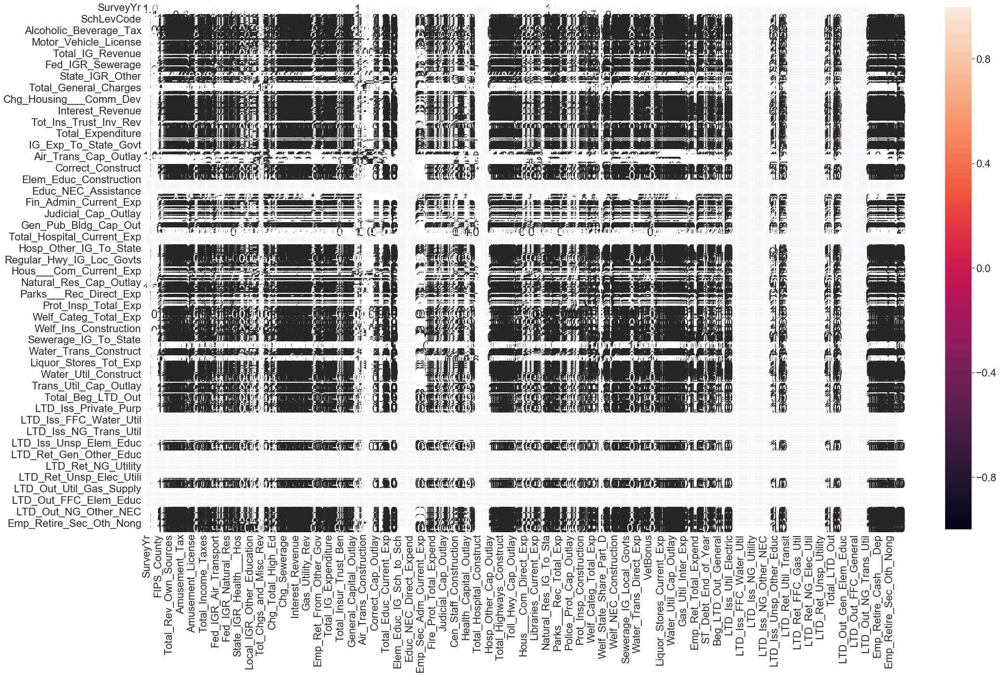

In [142]:
f,ax = plt.subplots(figsize=(35, 20))
sns.heatmap(df_StateCode48.corr(), annot=True, linewidths=.1, fmt= '.1f',ax=ax)

In [113]:
df_StateCode48.iplot(x='Population', y='Total_Revenue', categories='Name', xTitle='Population Per City', yTitle='Total Revenue Per City', title='Reading Percent vs Read Ratio by Publication')


In [87]:
#df3=df2['Name']
#names = list(df3)
#print(names)

In [88]:
#df2[df2['Name'].str.contains("KENT")]

In [ ]:
Sub_df1 = df[['Year4', 'ID', 'State_Code', 'Type_Code', 'County', 'Name', 'Population', 'Total_Revenue', 'Property_Tax', 'Tot_Sales___Gr_Rec_Tax', 'Public_Utility_Tax', 'Total_License_Taxes', 'Total_Income_Taxes', 'Total_Fed_IG_Revenue', 'Total_State_IG_Revenue', 'Tot_Local_IG_Rev']]
